In [1]:
import tensorflow as tf
import imutils
import cv2
import pickle
import config
import numpy as np
import pandas as pd
import glob
import os
from vaegan import build_gan
from vaegan import build_vae
from vaegan import build_vaegan
import matplotlib.pyplot as plt
from utils.aspect_aware_resize import AspectAwareResize
%matplotlib inline

tf_config = tf.ConfigProto()
tf_config.gpu_options.allow_growth = True

In [2]:
_, data = pickle.load(open("celeba.p", "rb")) 
print(data.shape)

(200, 64, 64, 3)


In [3]:
# interpolation algorithms
def slerp(q1, q2, mu):
    theta = np.arccos(np.radians(q1*q2))
    s = ((np.sin(1-mu)*theta)/np.sin(theta)) * q1 + (np.sin(mu*theta)/np.sin(theta)) * q2
    
    return s

def linear(q1, q2, alpha):
    return alpha*q1 + (1-alpha)*q2

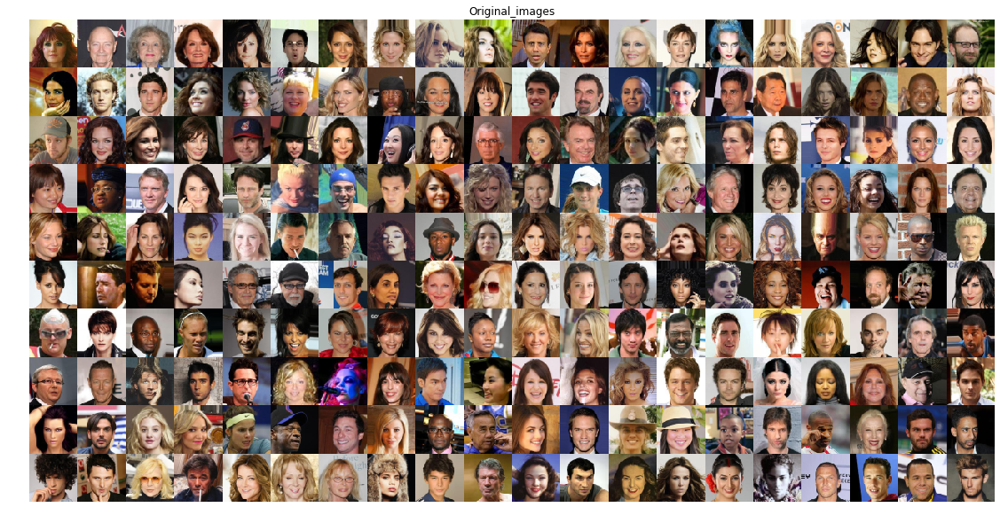

In [4]:
data_img = imutils.build_montages([i for i in data], (64, 64), (20, 10))[0]

plt.figure(figsize=(20, 10))
plt.title("Original_images")
plt.axis("off")
plt.imshow(cv2.cvtColor(data_img, cv2.COLOR_BGR2RGB))
plt.show()

## VAE

In [5]:
tf.reset_default_graph()

vae = build_vae(data.shape[0])
saver = tf.train.Saver()

In [6]:
sess = tf.Session(config=tf_config)

saver.restore(sess, "vae/vae")
reconstruct, mse = sess.run([vae["recon"], vae["mse_loss"]], feed_dict={vae["X"]: data, vae["is_train"]: False})

sess.close()

print("Mean squared error: {}".format(mse))

INFO:tensorflow:Restoring parameters from vae/vae
Mean squared error: 275.26165771484375


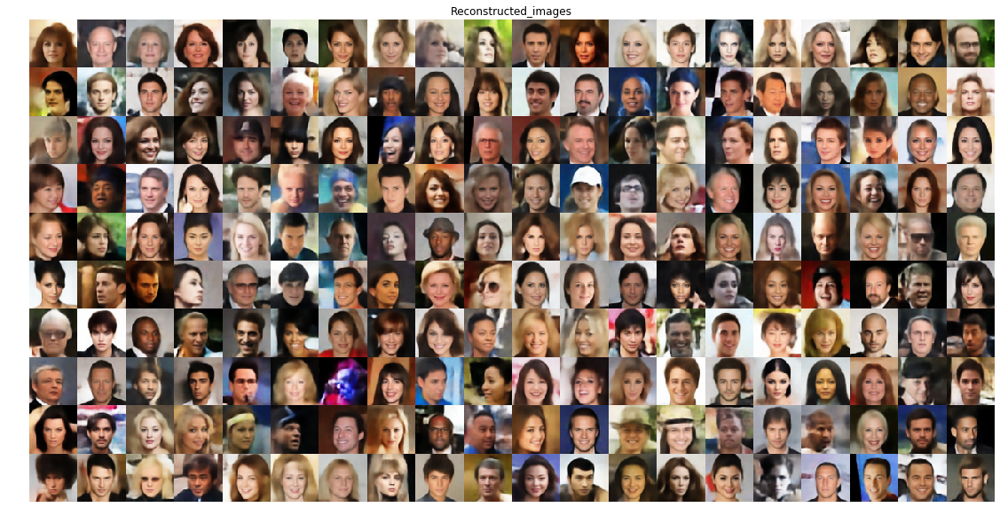

In [7]:
recon_img = imutils.build_montages([i for i in reconstruct], (64, 64), (20, 10))[0]

plt.figure(figsize=(20, 10))
plt.title("Reconstructed_images")
plt.axis("off")
plt.imshow(cv2.cvtColor(recon_img, cv2.COLOR_BGR2RGB))
plt.show()

In [8]:
# interpolation
tf.reset_default_graph()

vae = build_vae(1)
saver = tf.train.Saver()

img1 = data[161:162]
img2 = data[162:163]

sess = tf.Session(config=tf_config)
saver.restore(sess, "vae/vae")

e_img1 = sess.run(vae["Z"], feed_dict={vae["X"]: img1, vae["is_train"]: False})
e_img2 = sess.run(vae["Z"], feed_dict={vae["X"]: img2, vae["is_train"]: False})

INFO:tensorflow:Restoring parameters from vae/vae


In [9]:
imgs = [np.squeeze(img1, axis=0)]
for i in range(11):
    ss = slerp(e_img1, e_img2, i*0.1)
    out = sess.run(vae["recon"], feed_dict={vae["Z"]: ss, vae["is_train"]: False})

    imgs.append(np.squeeze(out, axis=0))
imgs.append(np.squeeze(img2, axis=0))

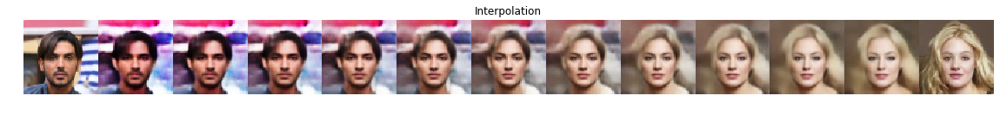

In [10]:
img = imutils.build_montages(imgs, (64, 64), (13, 1))[0]

plt.figure(figsize=(20, 10))
plt.title("Interpolation")
plt.axis("off")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

INFO:tensorflow:Restoring parameters from vae/vae


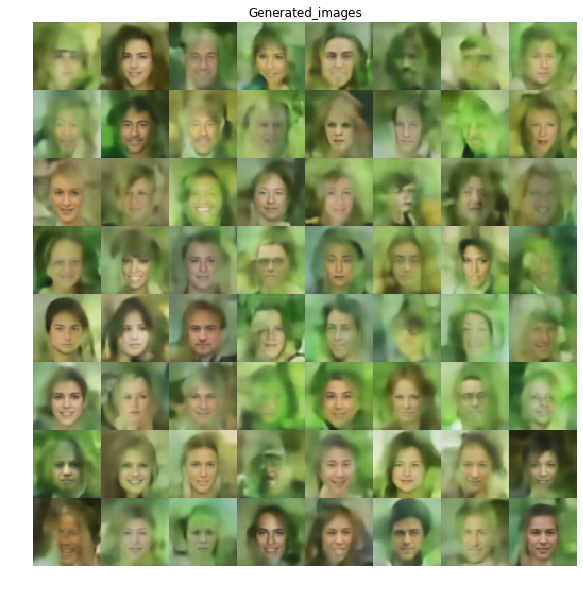

In [11]:
# generate samples
tf.reset_default_graph()

vae = build_vae(64)
saver = tf.train.Saver()

sess = tf.Session(config=tf_config)

z = np.random.normal(size=(64, config.latent_dim))

saver.restore(sess, "vae/vae")
samples = sess.run(vae["recon"], feed_dict={vae["Z"]: z, vae["is_train"]: False})

samples = imutils.build_montages([i for i in samples], (64, 64), (8, 8))[0]

plt.figure(figsize=(20, 10))
plt.title("Generated_images")
plt.axis("off")
plt.imshow(cv2.cvtColor(samples, cv2.COLOR_BGR2RGB))
plt.show()

# GAN

In [12]:
tf.reset_default_graph()

gan = build_gan(64)
saver = tf.train.Saver()

In [13]:
sess = tf.Session(config=tf_config)

z = np.random.normal(size=(64, config.latent_dim)).astype(np.float32)

saver.restore(sess, "gan/gan")
img = sess.run(gan["generate"], feed_dict={gan["Z"]: z, gan["is_train"]: False})

INFO:tensorflow:Restoring parameters from gan/gan


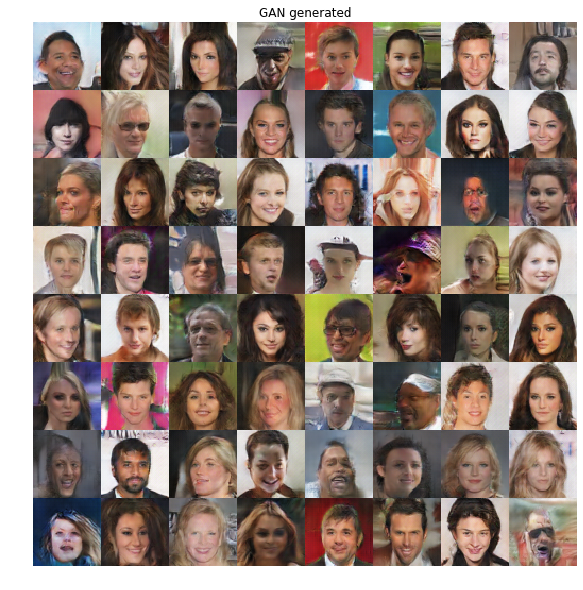

In [14]:
img = imutils.build_montages([i for i in img], (64, 64), (8, 8))[0]

plt.figure(figsize=(20, 10))
plt.title("GAN generated")
plt.axis("off")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

# VAE with l layer

In [15]:
tf.reset_default_graph()

vae = build_vae(data.shape[0], with_l=True)
saver = tf.train.Saver()

In [16]:
sess = tf.Session(config=tf_config)

saver.restore(sess, "vae_l/vae")
reconstruct, mse = sess.run([vae["recon"], vae["mse_loss"]], feed_dict={vae["X"]: data, vae["is_train"]: False})

sess.close()

print("Mean squared error: {}".format(mse))

INFO:tensorflow:Restoring parameters from vae_l/vae
Mean squared error: 278.9693908691406


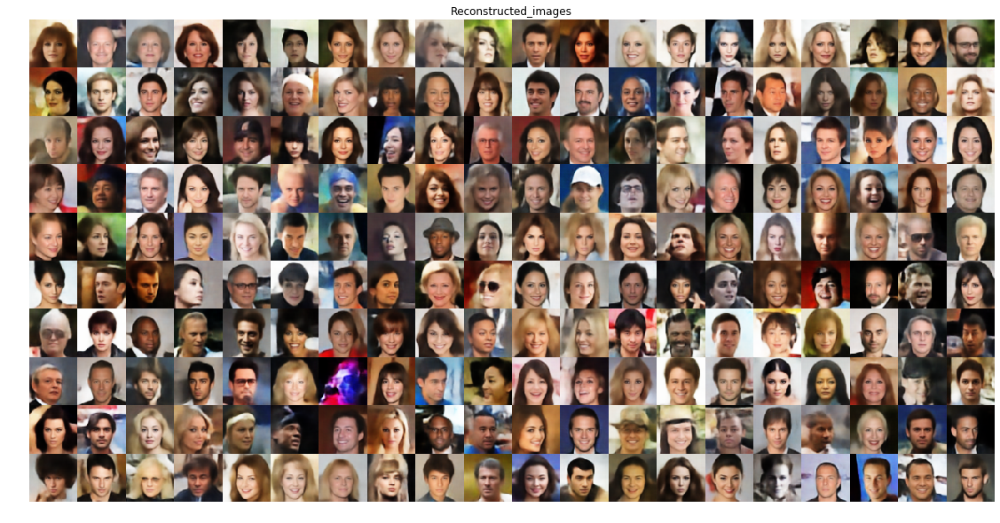

In [17]:
recon_img = imutils.build_montages([i for i in reconstruct], (64, 64), (20, 10))[0]

plt.figure(figsize=(20, 10))
plt.title("Reconstructed_images")
plt.axis("off")
plt.imshow(cv2.cvtColor(recon_img, cv2.COLOR_BGR2RGB))
plt.show()

In [18]:
# interpolation
tf.reset_default_graph()

vae = build_vae(1)
saver = tf.train.Saver()

img1 = data[161:162]
img2 = data[162:163]

sess = tf.Session(config=tf_config)
saver.restore(sess, "vae_l/vae")

e_img1 = sess.run(vae["Z"], feed_dict={vae["X"]: img1, vae["is_train"]: False})
e_img2 = sess.run(vae["Z"], feed_dict={vae["X"]: img2, vae["is_train"]: False})

INFO:tensorflow:Restoring parameters from vae_l/vae


In [19]:
imgs = [np.squeeze(img1, axis=0)]
for i in range(11):
    ss = slerp(e_img1, e_img2, i*0.1)
    out = sess.run(vae["recon"], feed_dict={vae["Z"]: ss, vae["is_train"]: False})

    imgs.append(np.squeeze(out, axis=0))
imgs.append(np.squeeze(img2, axis=0))

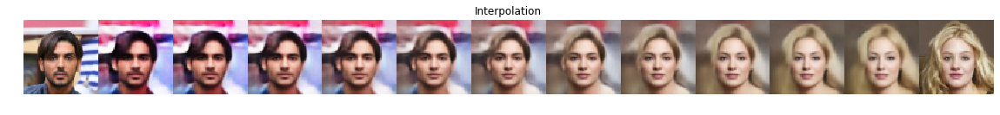

In [20]:
img = imutils.build_montages(imgs, (64, 64), (13, 1))[0]

plt.figure(figsize=(20, 10))
plt.title("Interpolation")
plt.axis("off")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

INFO:tensorflow:Restoring parameters from vae_l/vae


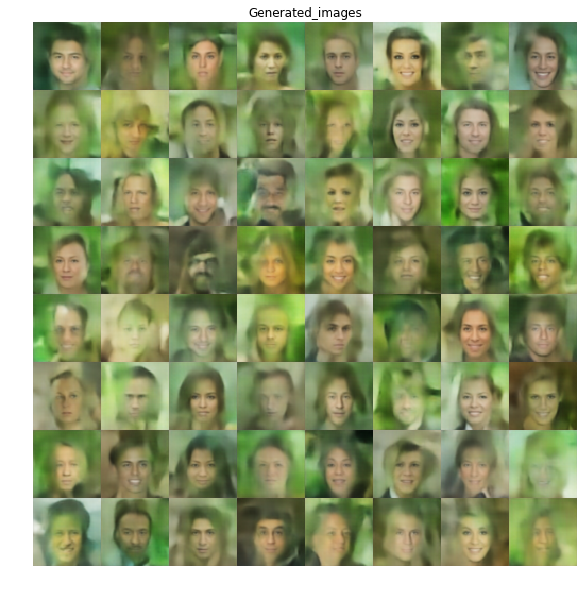

In [21]:
# generate samples
tf.reset_default_graph()

vae = build_vae(64, with_l=True)
saver = tf.train.Saver()

sess = tf.Session(config=tf_config)

z = np.random.normal(size=(64, config.latent_dim))

saver.restore(sess, "vae_l/vae")
samples = sess.run(vae["recon"], feed_dict={vae["Z"]: z, vae["is_train"]: False})

samples = imutils.build_montages([i for i in samples], (64, 64), (8, 8))[0]

plt.figure(figsize=(20, 10))
plt.title("Generated_images")
plt.axis("off")
plt.imshow(cv2.cvtColor(samples, cv2.COLOR_BGR2RGB))
plt.show()

# VAE-GAN

In [22]:
tf.reset_default_graph()

gan = build_vaegan(data.shape[0])
saver = tf.train.Saver()

In [23]:
sess = tf.Session(config=tf_config)

# reconstruct
saver.restore(sess, "vaegan/vaegan")
reconstruct = sess.run(gan["recon"], feed_dict={gan["X"]: data, gan["is_train"]: False})

# generate
z = np.random.normal(size=(data.shape[0], config.latent_dim)).astype(np.float32)
img = sess.run(gan["generate"], feed_dict={gan["Z"]: z, gan["is_train"]: False})


sess.close()

INFO:tensorflow:Restoring parameters from vaegan/vaegan


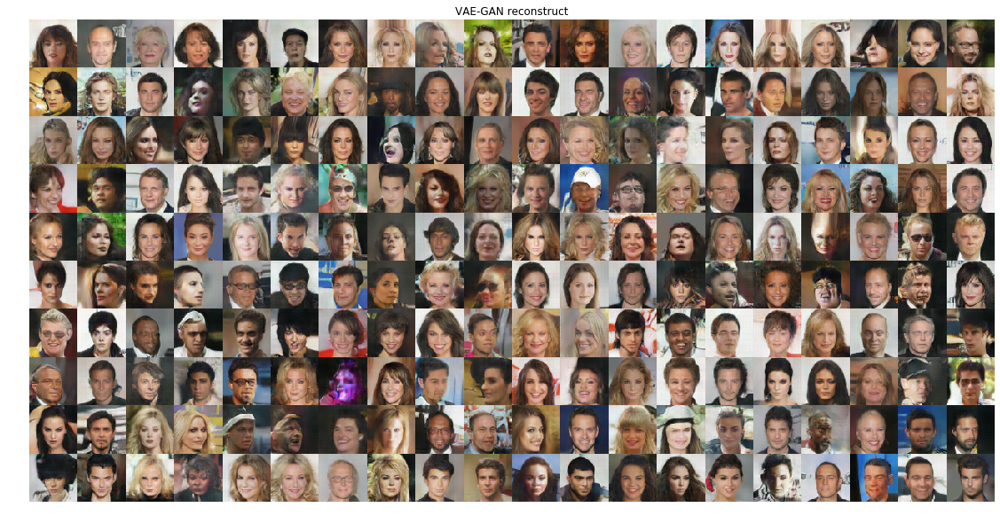

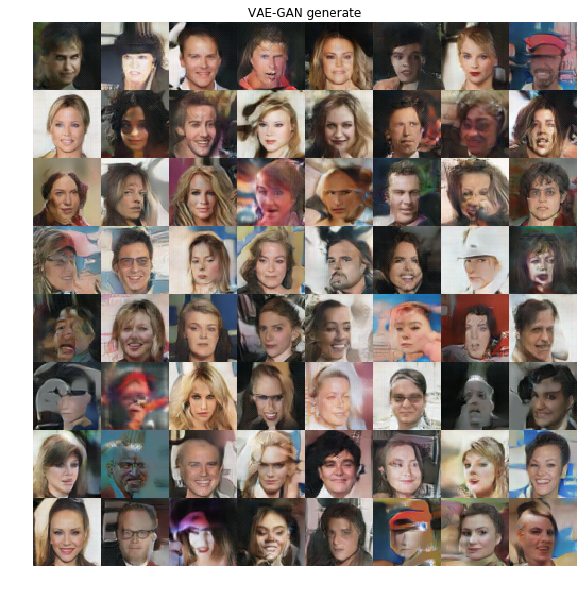

In [24]:
recon = imutils.build_montages([i for i in reconstruct], (64, 64), (20, 10))[0]

plt.figure(figsize=(20, 10))
plt.title("VAE-GAN reconstruct")
plt.axis("off")
plt.imshow(cv2.cvtColor(recon, cv2.COLOR_BGR2RGB))
plt.show()

img = img[:64]
img = imutils.build_montages([i for i in img], (64, 64), (8, 8))[0]

plt.figure(figsize=(20, 10))
plt.title("VAE-GAN generate")
plt.axis("off")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

INFO:tensorflow:Restoring parameters from vaegan/vaegan


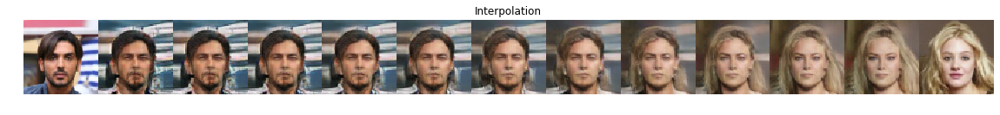

In [25]:
# interpolation
tf.reset_default_graph()

gan = build_vaegan(1)
saver = tf.train.Saver()

img1 = data[161:162]
img2 = data[162:163]

sess = tf.Session(config=tf_config)
saver.restore(sess, "vaegan/vaegan")

e_img1 = sess.run(gan["Z_t"], feed_dict={gan["X"]: img1, gan["is_train"]: False})
e_img2 = sess.run(gan["Z_t"], feed_dict={gan["X"]: img2, gan["is_train"]: False})

imgs = [np.squeeze(img1, axis=0)]
for i in range(11):
    ss = slerp(e_img1, e_img2, i*0.1)
    out = sess.run(gan["generate"], feed_dict={gan["Z"]: ss, gan["is_train"]: False})

    imgs.append(np.squeeze(out, axis=0))
imgs.append(np.squeeze(img2, axis=0))

img = imutils.build_montages(imgs, (64, 64), (13, 1))[0]

plt.figure(figsize=(20, 10))
plt.title("Interpolation")
plt.axis("off")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

## Playing with Visual Attribute Vectors [Not working]

In [26]:
files = glob.glob("img_align_celeba/*")

imgs = []
aar = AspectAwareResize(64, 64)
for file in files:
    f_name = os.path.split(file)[-1]
    img = cv2.imread(file)
    img = aar.preprocess(img)
    imgs.append(img)
    
imgs = np.stack(imgs)

In [27]:
attr_file = pd.read_csv("celeba/list_attr_celeba.csv")
attr_file = attr_file.drop("image_id", axis=1)
attributes = list(attr_file)

attr = attr_file.values

In [28]:
tf.reset_default_graph()

gan = build_vaegan(1)
saver = tf.train.Saver()

sess = tf.Session()
saver.restore(sess, "vaegan/vaegan")

INFO:tensorflow:Restoring parameters from vaegan/vaegan


In [29]:
blonde_vectors = []
blonde = imgs[attr[:, 9] == 1]
for i in blonde:
    tmp = sess.run(gan["Z_t"], feed_dict={gan["X"]: np.expand_dims(i, axis=0), gan["is_train"]: False})
    blonde_vectors.append(tmp)
    
unblonde_vectors = []
unblonde = imgs[attr[:, 9] == -1]
for i in unblonde:
    tmp = sess.run(gan["Z_t"], feed_dict={gan["X"]: np.expand_dims(i, axis=0), gan["is_train"]: False})
    unblonde_vectors.append(tmp)
    
glasses_vectors = []
glasses = imgs[attr[:, 15] == 1]
for i in glasses:
    tmp = sess.run(gan["Z_t"], feed_dict={gan["X"]: np.expand_dims(i, axis=0), gan["is_train"]: False})
    glasses_vectors.append(tmp)
    
unglasses_vectors = []
unglasses = imgs[attr[:, 15] == -1]
for i in unglasses:
    tmp = sess.run(gan["Z_t"], feed_dict={gan["X"]: np.expand_dims(i, axis=0), gan["is_train"]: False})
    unglasses_vectors.append(tmp)    

In [30]:
blonde_vector = np.vstack(blonde_vectors)
unblonde_vector = np.vstack(unblonde_vectors)

blonde_vector = np.mean(blonde_vector, axis=0)
unblonde_vector = np.mean(unblonde_vector, axis=0)

blonde_attr = blonde_vector - unblonde_vector 
blonde_attr = np.expand_dims(blonde_attr, axis=0)

glasses_vector = np.vstack(glasses_vectors)
unglasses_vector = np.vstack(unglasses_vectors)

glasses_vector = np.mean(glasses_vector, axis=0)
unglasses_vector = np.mean(unglasses_vector, axis=0)

glasses_attr = glasses_vector - unglasses_vector 
glasses_attr = np.expand_dims(glasses_attr, axis=0)

In [31]:
img = data[4:5]

z = sess.run(gan["Z_t"], feed_dict={gan["X"]: img, gan["is_train"]: False})

z_blonde = z + blonde_attr
z_glasses = z + glasses_attr

In [32]:
plus_blonde = sess.run(gan["generate"], feed_dict={gan["Z"]: z_blonde, gan["is_train"]: False})
plus_glasses = sess.run(gan["generate"], feed_dict={gan["Z"]: z_glasses, gan["is_train"]: False})
reconstruct = sess.run(gan["recon"], feed_dict={gan["X"]: img, gan["is_train"]: False})

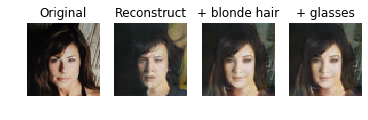

In [33]:
img = np.squeeze(img, axis=0).astype(np.uint8)
plus_blonde = np.squeeze(plus_blonde, axis=0).astype(np.uint8)
plus_glasses = np.squeeze(plus_glasses, axis=0).astype(np.uint8)
reconstruct = np.squeeze(reconstruct, axis=0).astype(np.uint8)

plt.subplot(141)
plt.title("Original")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis("off")

plt.subplot(142)
plt.title("Reconstruct")
plt.imshow(cv2.cvtColor(reconstruct, cv2.COLOR_BGR2RGB))
plt.axis("off")

plt.subplot(143)
plt.title("+ blonde hair")
plt.imshow(cv2.cvtColor(plus_blonde, cv2.COLOR_BGR2RGB))
plt.axis("off")

plt.subplot(144)
plt.title("+ glasses")
plt.imshow(cv2.cvtColor(plus_glasses, cv2.COLOR_BGR2RGB))
plt.axis("off")

plt.show()